### Task 1. Importing All Dependencies

In [173]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
%matplotlib inline

---

### Task 2. Loading Datasets

In [174]:
data = pd.read_csv('datasets.csv', encoding_errors = 'ignore')

---

### Task 3. Initial Ecploration

In [175]:
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
0,1.312228e+06,Rental unit in Brooklyn · ★5.0 · 1 bedroom,7130382,Walter,Brooklyn,Clinton Hill,40.683710,-73.964610,Private room,55.0,...,20/12/15,0.03,1.0,0.0,0.0,No License,5,1,1,Not specified
1,4.527754e+07,Rental unit in New York · ★4.67 · 2 bedrooms ·...,51501835,Jeniffer,Manhattan,Hell's Kitchen,40.766610,-73.988100,Entire home/apt,144.0,...,01/05/23,0.24,139.0,364.0,2.0,No License,4.67,2,1,1
2,9.710000e+17,Rental unit in New York · ★4.17 · 1 bedroom · ...,528871354,Joshua,Manhattan,Chelsea,40.750764,-73.994605,Entire home/apt,187.0,...,18/12/23,1.67,1.0,343.0,6.0,Exempt,4.17,1,2,1
3,3.857863e+06,Rental unit in New York · ★4.64 · 1 bedroom · ...,19902271,John And Catherine,Manhattan,Washington Heights,40.835600,-73.942500,Private room,120.0,...,17/09/23,1.38,2.0,363.0,12.0,No License,4.64,1,1,1
4,4.089661e+07,Condo in New York · ★4.91 · Studio · 1 bed · 1...,61391963,Stay With Vibe,Manhattan,Murray Hill,40.751120,-73.978600,Entire home/apt,85.0,...,03/12/23,0.24,133.0,335.0,3.0,No License,4.91,Studio,1,1


In [176]:
data.tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
20765,2.473690e+07,Rental unit in New York · ★4.75 · 1 bedroom · ...,186680487,Henry D,Manhattan,Lower East Side,40.711380,-73.991560,Private room,45.0,...,29/09/23,1.81,1.0,157.0,12.0,No License,4.75,1,1,1
20766,2.835711e+06,Rental unit in New York · ★4.46 · 1 bedroom · ...,3237504,Aspen,Manhattan,Greenwich Village,40.730580,-74.000700,Entire home/apt,105.0,...,01/07/23,0.48,1.0,0.0,1.0,No License,4.46,1,2,1
20767,5.182527e+07,Rental unit in New York · ★4.93 · 1 bedroom · ...,304317395,Jeff,Manhattan,Hell's Kitchen,40.757350,-73.993430,Entire home/apt,299.0,...,08/12/23,2.09,1.0,0.0,27.0,No License,4.93,1,1,1
20768,7.830000e+17,Rental unit in New York · ★5.0 · 1 bedroom · 1...,163083101,Marissa,Manhattan,Chinatown,40.713750,-73.991470,Entire home/apt,115.0,...,17/09/23,0.91,1.0,363.0,7.0,No License,5,1,1,1
20769,5.660000e+17,Rental unit in Queens · ★4.89 · 1 bedroom · 1 ...,93827372,Glenroy,Queens,Rosedale,40.658874,-73.728651,Private room,102.0,...,10/12/23,4.50,1.0,0.0,62.0,OSE-STRREG-0000513,4.89,1,1,1


In [177]:
data.shape

(20770, 22)

In [178]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20770 entries, 0 to 20769
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              20770 non-null  float64
 1   name                            20770 non-null  object 
 2   host_id                         20770 non-null  int64  
 3   host_name                       20770 non-null  object 
 4   neighbourhood_group             20770 non-null  object 
 5   neighbourhood                   20763 non-null  object 
 6   latitude                        20763 non-null  float64
 7   longitude                       20763 non-null  float64
 8   room_type                       20763 non-null  object 
 9   price                           20736 non-null  float64
 10  minimum_nights                  20763 non-null  float64
 11  number_of_reviews               20763 non-null  float64
 12  last_review                     

---

### Statistical Summary

In [179]:
data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,beds
count,2.077000e+04,2.077000e+04,20763.000000,20763.000000,20736.000000,20763.000000,20763.000000,20763.000000,20763.000000,20763.000000,20763.000000,20770.000000
mean,3.033858e+17,1.749049e+08,40.726821,-73.939179,187.714940,28.558493,42.610605,1.257589,18.866686,206.067957,10.848962,1.723592
std,3.901221e+17,1.725657e+08,0.060293,0.061403,1023.245124,33.532697,73.523401,1.904472,70.921443,135.077259,21.354876,1.211993
min,2.595000e+03,1.678000e+03,40.500314,-74.249840,10.000000,1.000000,1.000000,0.010000,1.000000,0.000000,0.000000,1.000000
25%,2.707260e+07,2.041184e+07,40.684159,-73.980755,80.000000,30.000000,4.000000,0.210000,1.000000,87.000000,1.000000,1.000000
50%,4.992852e+07,1.086990e+08,40.722890,-73.949597,125.000000,30.000000,14.000000,0.650000,2.000000,215.000000,3.000000,1.000000
75%,7.220000e+17,3.143997e+08,40.763106,-73.917475,199.000000,30.000000,49.000000,1.800000,5.000000,353.000000,15.000000,2.000000
max,1.050000e+18,5.504035e+08,40.911147,-73.713650,100000.000000,1250.000000,1865.000000,75.490000,713.000000,365.000000,1075.000000,42.000000


---

### Task 4. Data Cleaning

In [180]:
data.isnull().sum()

,0
id,0
name,0
host_id,0
host_name,0
neighbourhood_group,0
neighbourhood,7
latitude,7
longitude,7
room_type,7
price,34


---

#### Droping all missing values rows

In [181]:
data.dropna(inplace = True)
data.isnull().sum()

,0
id,0
name,0
host_id,0
host_name,0
neighbourhood_group,0
neighbourhood,0
latitude,0
longitude,0
room_type,0
price,0


In [182]:
data.shape

(20736, 22)

---

### Dealing with duplicates rows

In [183]:
data.duplicated().sum()

data[data.duplicated()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
6,4.527754e+07,Rental unit in New York · ★4.67 · 2 bedrooms ·...,51501835,Jeniffer,Manhattan,Hell's Kitchen,40.766610,-73.988100,Entire home/apt,144.0,...,01/05/23,0.24,139.0,364.0,2.0,No License,4.67,2,1,1
7,9.710000e+17,Rental unit in New York · ★4.17 · 1 bedroom · ...,528871354,Joshua,Manhattan,Chelsea,40.750764,-73.994605,Entire home/apt,187.0,...,18/12/23,1.67,1.0,343.0,6.0,Exempt,4.17,1,2,1
8,3.857863e+06,Rental unit in New York · ★4.64 · 1 bedroom · ...,19902271,John And Catherine,Manhattan,Washington Heights,40.835600,-73.942500,Private room,120.0,...,17/09/23,1.38,2.0,363.0,12.0,No License,4.64,1,1,1
9,4.089661e+07,Condo in New York · ★4.91 · Studio · 1 bed · 1...,61391963,Stay With Vibe,Manhattan,Murray Hill,40.751120,-73.978600,Entire home/apt,85.0,...,03/12/23,0.24,133.0,335.0,3.0,No License,4.91,Studio,1,1
10,4.958498e+07,Rental unit in New York · ★5.0 · 1 bedroom · 1...,51501835,Jeniffer,Manhattan,Hell's Kitchen,40.759950,-73.992960,Entire home/apt,115.0,...,29/07/23,0.16,139.0,276.0,2.0,No License,5,1,1,1
20736,7.990000e+17,Rental unit in New York · 2 bedrooms · 2 beds ...,224733902,CozySuites Copake,Manhattan,Upper East Side,40.768970,-73.957592,Entire home/apt,153.0,...,15/09/23,0.41,8.0,308.0,2.0,No License,No rating,2,2,2
20737,5.930000e+17,Rental unit in New York · ★4.79 · 2 bedrooms ·...,23219783,Rob,Manhattan,West Village,40.730220,-74.002910,Entire home/apt,175.0,...,22/11/23,2.03,4.0,129.0,25.0,No License,4.79,2,2,1
20738,9.230000e+17,Loft in New York · ★4.33 · 1 bedroom · 2 beds ...,520265731,Rodrigo,Manhattan,Greenwich Village,40.728390,-73.999540,Entire home/apt,156.0,...,02/01/24,2.60,1.0,356.0,9.0,Exempt,4.33,1,2,1
20739,1.336161e+07,Rental unit in New York · ★4.89 · 2 bedrooms ·...,8961407,Jamie,Manhattan,Harlem,40.805700,-73.946250,Entire home/apt,397.0,...,08/09/23,1.08,3.0,274.0,3.0,No License,4.89,2,2,1
20740,5.119566e+07,Rental unit in New York · Studio · 1 bed · 1 bath,51501835,Jeniffer,Manhattan,Chinatown,40.718360,-73.995850,Entire home/apt,100.0,...,25/05/23,0.08,139.0,306.0,1.0,No License,No rating,Studio,1,1


In [184]:
# Deleting all duplicated rows

data.drop_duplicates(inplace = True)
data.duplicated().sum()
data[data.duplicated()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths


In [185]:
data.dtypes

,0
id,float64
name,object
host_id,int64
host_name,object
neighbourhood_group,object
neighbourhood,object
latitude,float64
longitude,float64
room_type,object
price,float64


---

#### Type casting
#### changing data types

In [186]:
data['id'] = data['id'].astype(object)
data.dtypes

data['host_id'] = data['host_id'].astype(object)
data.dtypes


,0
id,object
name,object
host_id,object
host_name,object
neighbourhood_group,object
neighbourhood,object
latitude,float64
longitude,float64
room_type,object
price,float64


In [187]:
# data['baths'].unique()
data['baths'] = data['baths'].replace('Not specified', 0).astype(float)
data['baths'] = data['baths'].astype(float)
data.dtypes

,0
id,object
name,object
host_id,object
host_name,object
neighbourhood_group,object
neighbourhood,object
latitude,float64
longitude,float64
room_type,object
price,float64


---

## EDA
### Task 5. Data Analysis


#### Univariate Analysis

In [188]:
# Identifying the outliers in price

<Axes: xlabel='price'>

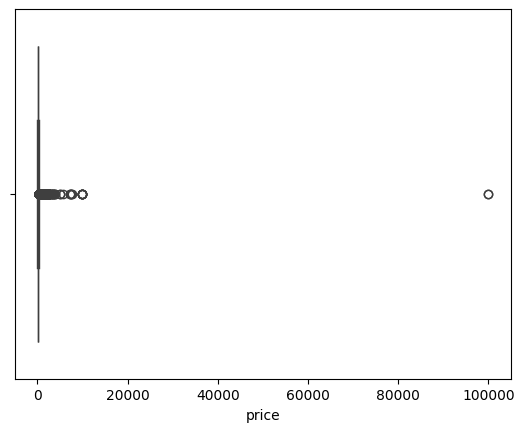

In [189]:
sns.boxplot(data = data, x = 'price')
# Thier is one outlier

<Axes: xlabel='price'>

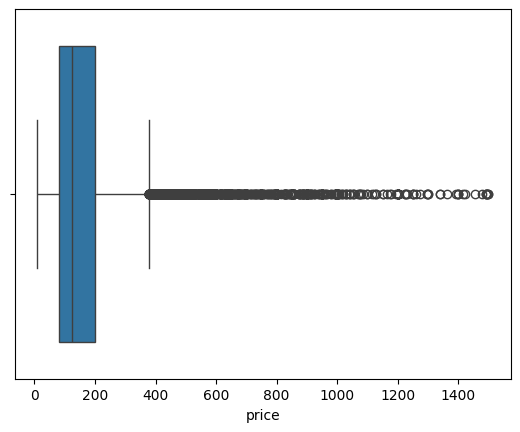

In [190]:
# Create the new dataframe

df = data[data['price'] < 1500]
sns.boxplot(data = df, x = 'price')

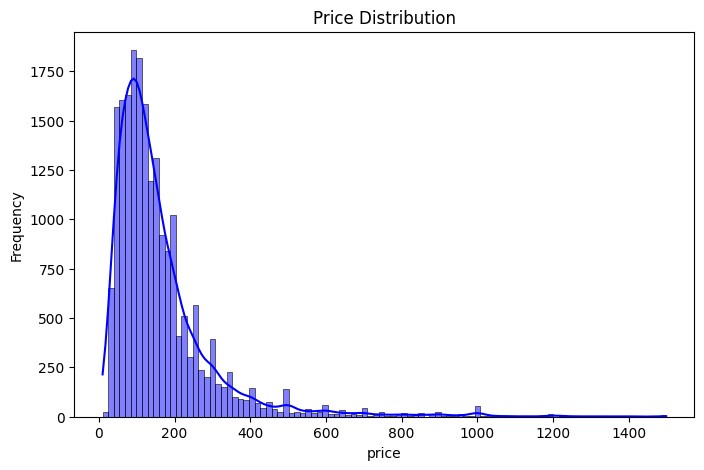

In [191]:
# Price distribution

plt.figure(figsize = (8, 5))
plt.title("Price Distribution")
sns.histplot(data = df, x = 'price', bins = 100, kde = True, color = 'blue')
plt.ylabel("Frequency")
plt.show()

<ipython-input-192-b4e3179197b8>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data = data, x = 'room_type', palette = 'viridis')


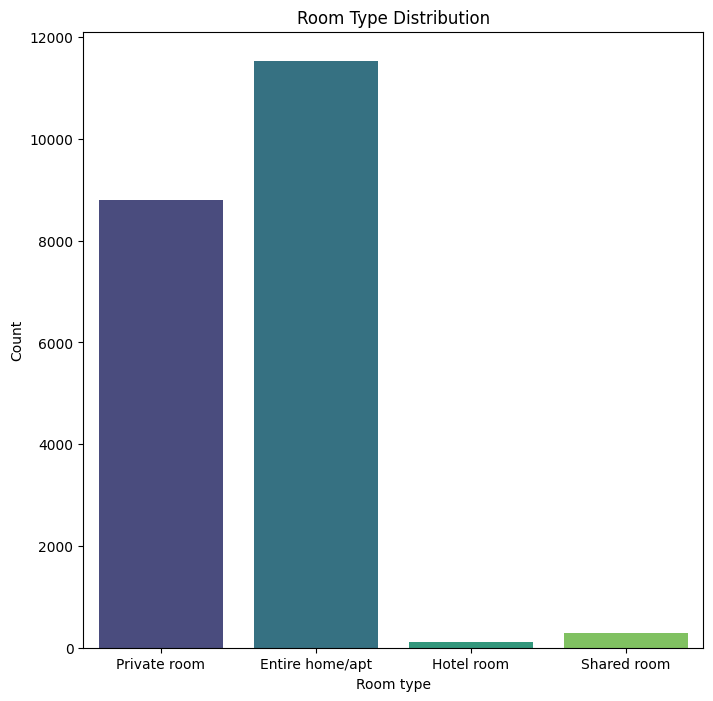

In [192]:
# Room type Distribution

plt.figure(figsize = (8, 8))
sns.countplot(data = data, x = 'room_type', palette = 'viridis')
plt.title('Room Type Distribution')
plt.xlabel('Room type')
plt.ylabel('Count')
plt.show()

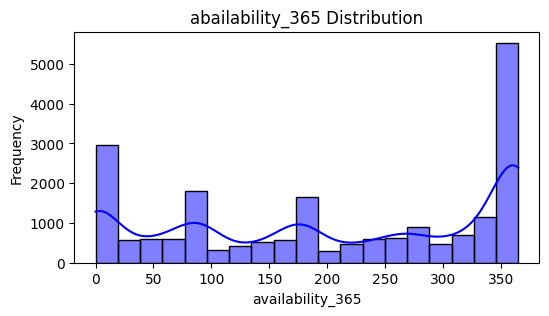

In [193]:
# Availability_365 Distribution

plt.figure(figsize = (6, 3))
plt.title("abailability_365 Distribution")
sns.histplot(data = data, x = 'availability_365', kde = True, color = 'blue')
plt.ylabel("Frequency")
plt.show()

<ipython-input-194-3e99925c2b7b>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data = data, x = 'neighbourhood_group', palette = 'magma')


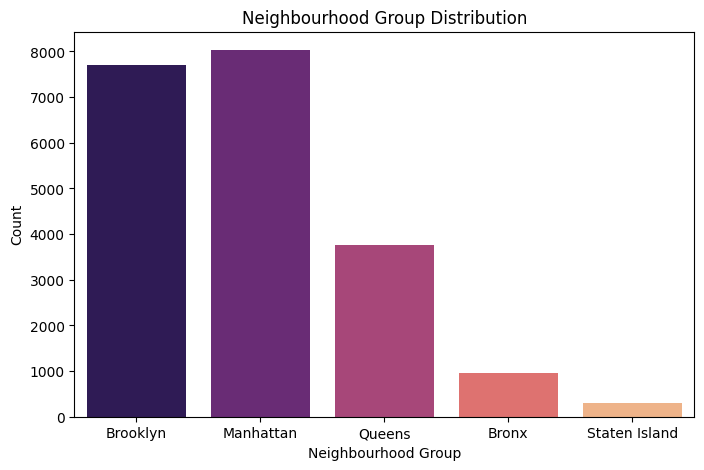

In [194]:
# Neighbourhood Group Distribution

plt.figure(figsize = (8, 5))
plt.title('Neighbourhood Group Distribution')
sns.countplot(data = data, x = 'neighbourhood_group', palette = 'magma')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Count')
plt.show()

In [195]:
df.groupby(by = 'neighbourhood_group')['price'].mean()

,price
neighbourhood_group,
Bronx,107.990506
Brooklyn,155.138317
Manhattan,204.146014
Queens,121.681939
Staten Island,118.780069


---

## Outlier detection

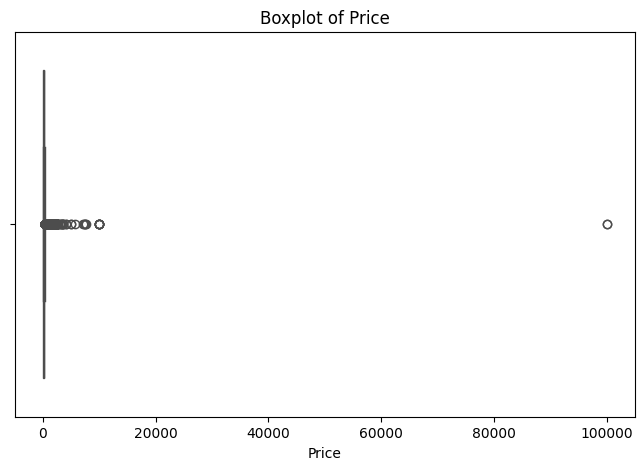

In [196]:
# Boxplot for price

plt.figure(figsize = (8, 5))
plt.title('Boxplot of Price')
sns.boxplot(data = data, x = 'price', color = 'orange')
plt.xlabel('Price')
plt.show()

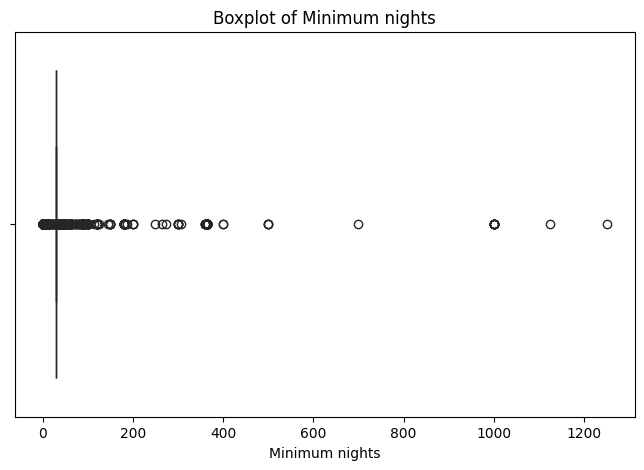

In [197]:
# Boxplot for minimum nights

plt.figure(figsize = (8, 5))
plt.title('Boxplot of Minimum nights')
sns.boxplot(data = data, x = 'minimum_nights', color = 'green')
plt.xlabel('Minimum nights')
plt.show()

---

### Feature engineering

In [198]:
# ['price per bed']
df['price per bed'] = df['price']/df['beds']
df['price per bed']

<ipython-input-198-a0046ed2b68f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['price per bed'] = df['price']/df['beds']


,price per bed
0,55.0
1,144.0
2,93.5
3,120.0
4,85.0
...,...
20765,45.0
20766,52.5
20767,299.0
20768,115.0


In [199]:
# Average price per bed
df.groupby(by = 'neighbourhood_group')['price per bed'].mean()

,price per bed
neighbourhood_group,
Bronx,74.713639
Brooklyn,99.788493
Manhattan,138.708057
Queens,76.336210
Staten Island,67.728101


In [200]:
# 'price per bath'

df['price per bath'] = df['price'] / df['baths']
df['price per bath']

<ipython-input-200-5b5386698083>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['price per bath'] = df['price'] / df['baths']


,price per bath
0,inf
1,144.0
2,187.0
3,120.0
4,85.0
...,...
20765,45.0
20766,105.0
20767,299.0
20768,115.0


In [213]:
# Average price per bath
df.groupby(by = 'neighbourhood_group')['price per bath'].mean()

,price per bath
neighbourhood_group,
Bronx,inf
Brooklyn,inf
Manhattan,inf
Queens,inf
Staten Island,inf


---

### Bi Variable Analysis

In [201]:
# One variable depenency in another variable

In [202]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'license', 'rating',
       'bedrooms', 'beds', 'baths', 'price per bed', 'price per bath'],
      dtype='object')

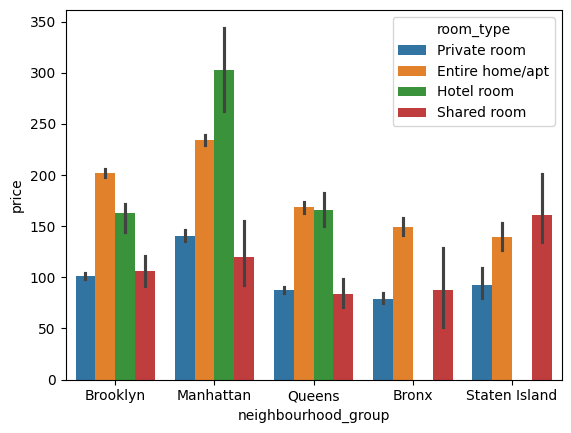

In [203]:
# Price dependency on neighbourhood
sns.barplot(data = df, x = 'neighbourhood_group', y = 'price', hue = 'room_type')
plt.show()

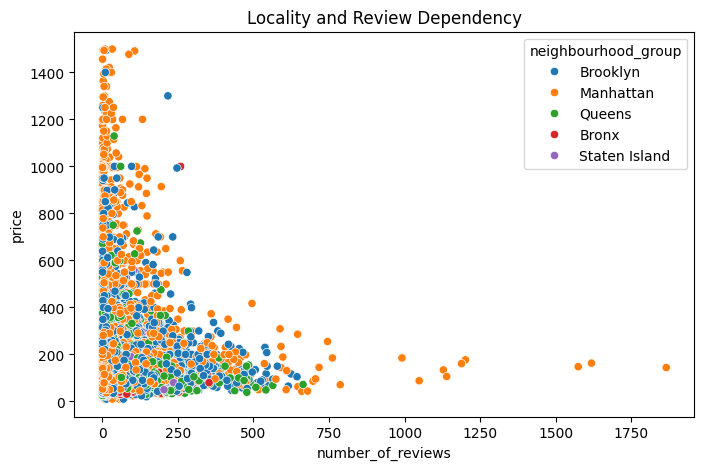

In [204]:
# Number of reviews and price relationship

plt.figure(figsize = (8, 5))
plt.title('Locality and Review Dependency')
sns.scatterplot(data = df, x = 'number_of_reviews', y = 'price', hue = 'neighbourhood_group')
plt.show()

In [205]:
df.dtypes

,0
id,object
name,object
host_id,object
host_name,object
neighbourhood_group,object
neighbourhood,object
latitude,float64
longitude,float64
room_type,object
price,float64


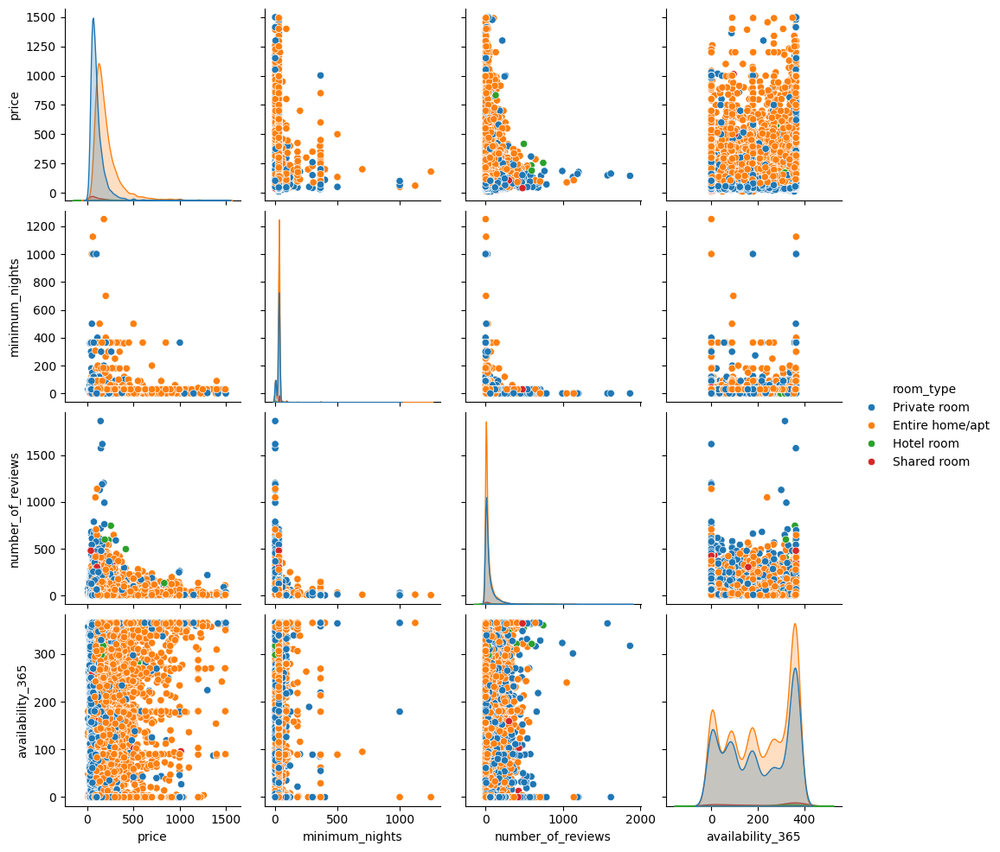

In [206]:
sns.pairplot(data = df, vars = ['price', 'minimum_nights', 'number_of_reviews', 'availability_365'], hue = 'room_type')
plt.show()

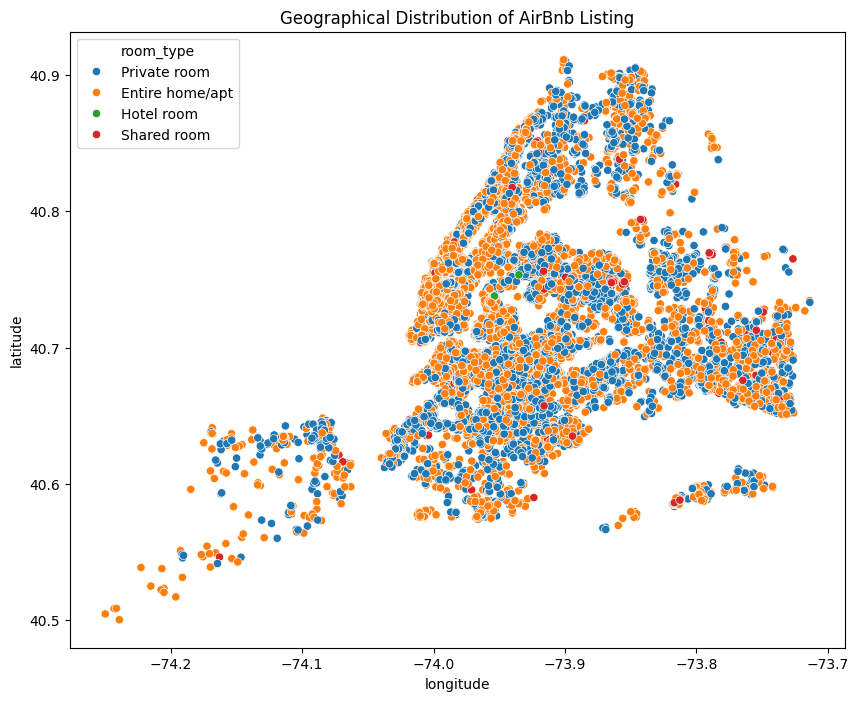

In [207]:
# Geographical Distribution of AirBnb Listing
plt.figure(figsize=(10, 8))
plt.title('Geographical Distribution of AirBnb Listing')
sns.scatterplot(data = df, x = 'longitude', y = 'latitude', hue = 'room_type')
plt.show()

In [208]:
df.dtypes

,0
id,object
name,object
host_id,object
host_name,object
neighbourhood_group,object
neighbourhood,object
latitude,float64
longitude,float64
room_type,object
price,float64


In [209]:
# Heatmap = correlation of one variable with others for numerical column

corr = df[['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'availability_365', 'beds']].corr()
corr

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,availability_365,beds
latitude,1.000000,0.047369,0.012686,0.004590,-0.047953,-0.041673,-0.005941,-0.071753
longitude,0.047369,1.000000,-0.193728,0.023890,0.004820,0.041720,0.063523,0.041832
price,0.012686,-0.193728,1.000000,-0.044635,-0.043533,-0.012775,0.048036,0.415278
minimum_nights,0.004590,0.023890,-0.044635,1.000000,-0.059049,-0.122509,0.035466,-0.025852
number_of_reviews,-0.047953,0.004820,-0.043533,-0.059049,1.000000,0.631005,-0.049656,0.040071
reviews_per_month,-0.041673,0.041720,-0.012775,-0.122509,0.631005,1.000000,-0.040116,0.053496
availability_365,-0.005941,0.063523,0.048036,0.035466,-0.049656,-0.040116,1.000000,0.065985
beds,-0.071753,0.041832,0.415278,-0.025852,0.040071,0.053496,0.065985,1.000000


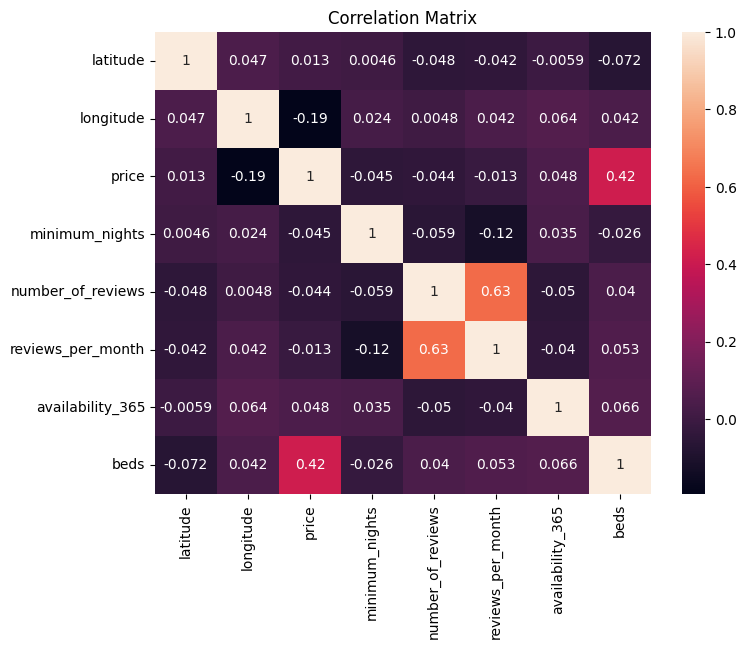

In [210]:
plt.figure(figsize = (8, 6))
plt.title("Correlation Matrix")
sns.heatmap(data = corr, annot = True)
plt.show()

---

## Advanced EDA

**In this section we use the statistical implementation from scikit learn to do price prediction and mean_squared_error**

In [211]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

X = data[['minimum_nights', 'number_of_reviews', 'availability_365']]
y = data['price']

# split the data into traing and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# now create the model and train the model
model = LinearRegression()
model.fit(X_train, y_train)

# now predict
y_pred = model.predict(X_test)

# evaluate
mse = mean_squared_error(y_test, y_pred)

# print('Prediction', y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 103381.85337365464


---

In [212]:
### Help from Deep sheek
import folium
from folium.plugins import HeatMap
# Create a base map centered around NYC
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

# Add markers for each listing
for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(nyc_map)

# Display the map
nyc_map